In [3]:
%pylab inline
import os
import gc
import emcee
import corner
from ddmap import halosim

import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser
from ddmap.pixel3D import cartesianGrid3D

print('Run me on IDark')
figMsDir='/work/xiangchong.li/work/massMapSparse/sim/plot/'
datDir=os.path.join(os.environ['homeWrk'],'S16ACatalogs')

Populating the interactive namespace from numpy and matplotlib
Run me on IDark


In [4]:
cd wrkDir/sim

/lustre/work/xiangchong.li/work/massMapSparse/sim


In [5]:
iz   =   2
im  =   6
ver =  'pix48-ns10'
zer =  'zt' #pz/zt
ner =  'wn_23' #wn-1/nn
if 'wn_' in ner:
    isim=   eval(ner.split('_')[-1])
else:
    isim=0
ver2='nl10-pc'

hdir='planck-cosmo/pre-run/%s/' %ver

haloCat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
# Simulation
mm=(haloCat['iz']==iz)&(haloCat['im']==im)
hh=haloCat[mm]

z_h=hh['zh']
log_m=hh['log10_M200']
M_200=   10.**(log_m)
conc =   6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
assert conc==hh['conc']

halo =   halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
print('Halo redshift is %.2f' %z_h)
print('Halo mass is logM = %.2f, and M= %.2fe14' %(log_m,M_200/1e14))

Halo redshift is 0.25
Halo mass is logM = 14.74, and M= 5.47e14


In [6]:
infname1   =  os.path.join(hdir,'pixes','pixShearR-g1-%d-%d-%s-%s.fits' %(iz,im,zer,ner))
infname2   =  os.path.join(hdir,'pixes','pixShearR-g2-%d-%d-%s-%s.fits' %(iz,im,zer,ner))
infname3   =  os.path.join(hdir,'pixStd.fits')

assert os.path.isfile(infname1)
assert os.path.isfile(infname2)
assert os.path.isfile(infname3)

data=pyfits.getdata(infname1)+ pyfits.getdata(infname2)*1j
dataErr=pyfits.getdata(infname3)

# configuration
configName  =   'planck-cosmo/config-pix48-%s.ini' %ver2.split('-')[0]
print('configuration: ',configName)
parser      =   ConfigParser()
parser.read(configName)

gridInfo    =   cartesianGrid3D(parser)
Z,Y,X=np.meshgrid(gridInfo.zcgrid,gridInfo.ycgrid,gridInfo.xcgrid,indexing='ij')


dtheta=parser.getfloat('transPlane','scale')*60. #arcsec
print('rs of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta))
print('concentration is: %s' %(halo.c))
print('the average density contrast should be %.3f.' %(halo.M/(halo.rs/halo.c)**2./np.pi/halo.Sigma_M_bin(0.51,0.56)))

configuration:  planck-cosmo/config-pix48-nl10.ini
rs of the input halo is 0.981 pixels.
concentration is: 3.822392750119385
the average density contrast should be 4.805.


In [55]:
x,y,z=(X.flatten(),Y.flatten(),Z.flatten())
def log_likelihood(pars, shear, error):
    # get halo
    logm,zh=pars
    m200  =  10.**(logm)
    c     =  6.02*(m200/1.E13)**(-0.12)*(1.47/(1.+zh))**(0.16)
    halo  =  halosim.nfw_lensTJ03(mass=m200,conc=c,redshift=zh,ra=0.,dec=0.)
    
    lensKer= halo.lensKernel(z)
    shearM=  halo.DeltaSigmaComplex(x*3600.,y*3600.)*lensKer
    errM  =  error.max()
    msk   =  (error>errM/1e3)
    res2  =  np.abs(shearM[msk]-shear[msk])**2.
    var   =  error[msk]**2.
    return -0.5 * np.sum( res2  / var)

def log_prior(pars):
    zdet=0.25
    logm,zh=pars
    if 14. < logm < 16. and 0. < zh < zdet+0.2:
        return 0.0
    return -np.inf

def log_probability(pars, y, yerr):
    lp = log_prior(pars)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(pars, y, yerr)

In [56]:
halo  =  halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
lensKer= halo.lensKernel(z)
data2 =  halo.DeltaSigmaComplex(x*3600.,y*3600.)*lensKer

pp=np.array([log_m[0],z_h[0]])
log_likelihood(pp,data2,dataErr.flatten())


pars0 = pp + 1e-1 * np.random.randn(32, 2)
nwalkers, ndim = pars0.shape

sampler = emcee.EnsembleSampler(
    nwalkers, ndim, log_probability, args=(data2, dataErr.flatten())
)

In [71]:
sampler.run_mcmc(pars0, 500);

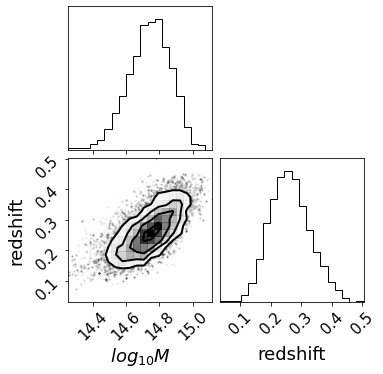

In [74]:
fig = corner.corner(
    sampler.flatchain, labels=(r'$log_{10} M$', 'redshift')
)